<a href="https://colab.research.google.com/github/mmestres91/store_sales_forecasting/blob/main/store_ts_forecasting_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
from pandasql import sqldf

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Data Science Projects/store-sales-time-series-forecasting/train.csv')

In [ ]:
df.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [ ]:
#Review Header and Top 5 Rows of data, shape, dtypes and Null Values

print(df.head())
print('\n')
print("Shape of the Data is: ", df.shape)
print('\n')
print(df.dtypes)
print('\n')
print("Are there any Null Values? ", df.isnull().values.any())
print('\n')
print(df.describe(include="all"))

   id        date  store_nbr      family  sales  onpromotion
0   0  2013-01-01          1  AUTOMOTIVE    0.0            0
1   1  2013-01-01          1   BABY CARE    0.0            0
2   2  2013-01-01          1      BEAUTY    0.0            0
3   3  2013-01-01          1   BEVERAGES    0.0            0
4   4  2013-01-01          1       BOOKS    0.0            0


Shape of the Data is:  (3000888, 6)


id               int64
date            object
store_nbr        int64
family          object
sales          float64
onpromotion      int64
dtype: object


Are there any Null Values?  False


                  id        date     store_nbr      family         sales  \
count   3.000888e+06     3000888  3.000888e+06     3000888  3.000888e+06   
unique           NaN        1684           NaN          33           NaN   
top              NaN  2013-01-01           NaN  AUTOMOTIVE           NaN   
freq             NaN        1782           NaN       90936           NaN   
mean    1.500444e+06    

In [65]:
#Review Global Daily Sales

q = '''
       SELECT 
           date(date) as date,
           SUM(sales) as sales
       FROM 
           df 
       GROUP BY 
           1
       ORDER BY 1
    '''
global_sales = sqldf(q, globals())

In [66]:
fig = px.line(global_sales, 
              x="date", y="sales",
              template = 'plotly_dark',
              title="Global Daily Sales")
fig.show()

In [ ]:
# Review Sales by Store

q = '''
       SELECT 
           date(date) as date,
           store_nbr,
           SUM(sales) as sales
       FROM 
           df 
       GROUP BY 
           1, 2
       ORDER BY 1
    '''
sales_stores = sqldf(q, globals())

fig = px.line(sales_stores, 
              x="date", y="sales", color ="store_nbr",
              template = 'plotly_dark',
              title="Daily Transaction Sales by Store")
fig.show()

In [57]:
fig = px.box(sales_stores, 
              x="sales",
             color="store_nbr",
              template = 'plotly_dark',
              title="Sales - Store")
fig.show()

In [ ]:
# 54 Stores
# Dates from 1/2013 - 8/2017

# 
# A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

In [ ]:
# Review Sales by Family

q = '''
       SELECT 
           date(date) as date,
           family,
           SUM(sales) as sales
       FROM 
           df 
       GROUP BY 
           1, 2
       ORDER BY 1
    '''
sales_family = sqldf(q, globals())

fig = px.line(sales_family, 
              x="date", y="sales", color ="family",
              template = 'plotly_dark',
              title="Daily Transaction Sales by Family")
fig.show()

In [ ]:
fig = px.box(sales_family, 
              x="sales", color = "family",
              template = 'plotly_dark',
              title="Sales - Family")
fig.show()

In [ ]:
# 33 Unique Family Categories 
# Top Sales Categories - Grocery I, Beverages, Produce, Cleaning Supplies & Frozen Foods
# Grocery contains largest sales transaction outlier - Apr 18, 2016 -  583k 
# Meats - Outlier - Oct 7, 2016 - 114K

In [59]:
# Review Promotions by Store

q = '''
       SELECT 
           date(date) as date,
           store_nbr,
           SUM(onpromotion) as promotions
       FROM 
           df 
       GROUP BY 
           1, 2
       ORDER BY 1
    '''
sales_stores = sqldf(q, globals())

fig = px.line(sales_stores, 
              x="date", y="promotions", color ="store_nbr",
              template = 'plotly_dark',
              title="Daily # of Promoted Items by Store")
fig.show()

In [60]:
# Review Promotions by Store

q = '''
       SELECT 
           date(date) as date,
           family,
           SUM(onpromotion) as promotions
       FROM 
           df 
       GROUP BY 
           1, 2
       ORDER BY 1
    '''
promotions_family = sqldf(q, globals())

fig = px.line(promotions_family, 
              x="date", y="promotions", color ="family",
              template = 'plotly_dark',
              title="Daily # of Promoted Items by Family")
fig.show()

In [86]:
oil_df = pd.read_csv('/content/drive/MyDrive/Data Science Projects/store-sales-time-series-forecasting/oil.csv')

In [62]:
oil_df.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [64]:
fig = px.line(oil_df, 
              x="date", y="dcoilwtico",
              template = 'plotly_dark',
              title="Daily Oil Prices")
fig.show()

In [68]:
trans_df = pd.read_csv('/content/drive/MyDrive/Data Science Projects/store-sales-time-series-forecasting/transactions.csv')

In [69]:
trans_df.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [80]:
# Review Global Daily Transactions

q = '''
       SELECT 
           date(date) as date,
           SUM(transactions) as transactions
       FROM 
           trans_df 
       GROUP BY 
           1
       ORDER BY 
           1
    '''
global_trans = sqldf(q, globals())

fig = px.line(global_trans, 
              x="date", y="transactions",
              template = 'plotly_dark',
              title="Global Daily Transactions")
fig.show()

In [76]:
# Review Daily Transactions by Store

q = '''
       SELECT 
           date(date) as date,
           store_nbr,
           SUM(transactions) as transactions
       FROM 
           trans_df 
       GROUP BY 
           1, 2
       ORDER BY 
           1, 2
    '''
store_trans = sqldf(q, globals())

fig = px.line(store_trans, 
              x="date", y="transactions", color="store_nbr",
              template = 'plotly_dark',
              title="Daily Transactions by Store")
fig.show()

In [77]:
fig = px.box(store_trans, 
              x="transactions", color = "store_nbr",
              template = 'plotly_dark',
              title="Transactions - Store")
fig.show()

In [87]:
#Review Global Sales, Transactions & Oil Prices (Line Plot & Correlation Plot)

#global_trans
#oil_df
#global_sales

merged_df = global_sales.merge(global_trans, how='inner', on='date')
fn_merged_df = merged_df.merge(oil_df, how='inner', on='date')

In [97]:
df_date = fn_merged_df[['date']]
df_values = fn_merged_df[['sales', 'transactions','dcoilwtico']]

#df_values

In [104]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(df_values)
global_df = pd.DataFrame(x_scaled)
global_df = global_df.rename(columns={0: "sales", 1: "transactions", 2: "oil"})

result = pd.concat([df_date, global_df], axis=1)

#result

,date,sales,transactions,oil
0,2013-01-01,0.000000,0.000000,NaN
1,2013-01-02,0.352609,0.542521,0.792965
2,2013-01-03,0.256430,0.456188,0.790951
3,2013-01-04,0.251428,0.456129,0.792728
4,2013-01-07,0.238329,0.439128,0.793675
...,...,...,...,...
1197,2017-08-09,0.522668,0.496963,0.277153
1198,2017-08-10,0.463550,0.482949,0.264716
1199,2017-08-11,0.588559,0.521018,0.267914
1200,2017-08-14,0.541801,0.496940,0.253464


In [103]:
fig = px.line(result, 
              x="date", y="sales",
              template = 'plotly_dark',
              title="Global Sales, Transactions & Oil")

fig.add_scatter(x=result['date'], y=result['transactions'], name="Transactions")
fig.add_scatter(x=result['date'], y=result['oil'], name="Oil")
fig.show()

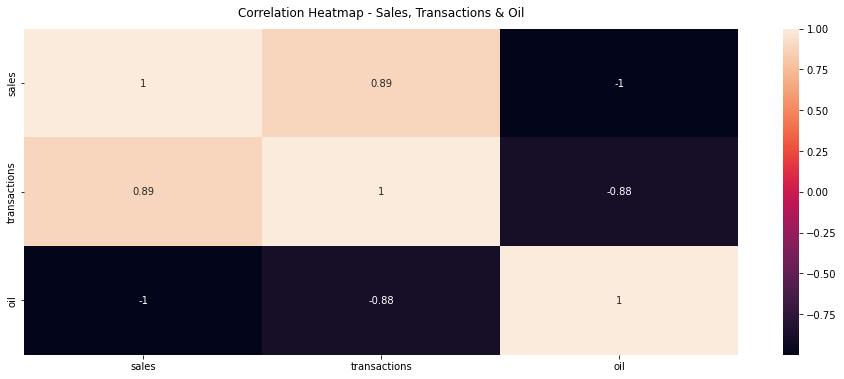

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 6))

corr = result.corr()
heatmap = sns.heatmap(corr.corr(), annot=True);

heatmap.set_title('Correlation Heatmap - Sales, Transactions & Oil', fontdict={'fontsize':12}, pad=12);